In [1]:
import pandas as pd
import os
import numpy as np
from matplotlib import pyplot as plt
import IPython
import librosa
import librosa.display

In [2]:
vocal_name = 'father_vox1_section_7.wav' # bad pitch recognition example 
instr_name = 'father_beat_section_4.wav'


base_path_audio = r'C:\Work\VocMatch\data\audio_dataset\train'
base_path_df = r'C:\Work\VocMatch\results\plotted_dfs\Week1\pitch_creepe'

In [3]:
# Load the whole exel file

path_to_df = os.path.join(base_path_df,f'Distances to {instr_name}.xlsx')
df = pd.read_excel(path_to_df, index_col=0) 

# Load a specific row
instr_row = df.loc[df['file_name'] == vocal_name]

In [4]:
# Pitch curves
distance = round(instr_row['distance'].item(),4)
vocal_encodings = list(map(float,instr_row['vocal_encoding'].item().replace('[',"").replace("]","").split(", ")))
instr_encodings = list(map(float,instr_row['instrumental_encoding'].item().replace('[',"").replace("]","").split(", ")))
time = np.linspace(0,10,len(vocal_encodings))

In [5]:
full_path_vocal = os.path.join(base_path_audio,vocal_name)
full_path_instr = os.path.join(base_path_audio,instr_name)

In [6]:
IPython.display.Audio(full_path_vocal)

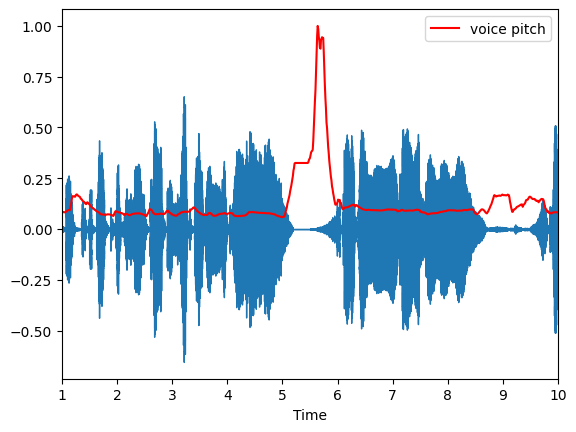

In [13]:
y, sr = librosa.load(full_path_vocal, mono=True, duration=10)
librosa.display.waveshow(y, sr=sr)
plt.xlim([1,10])
plt.plot(time, np.array(vocal_encodings)/max(vocal_encodings), c='red',label='voice pitch')
plt.legend()
plt.show()

In [286]:
IPython.display.Audio(full_path_instr)

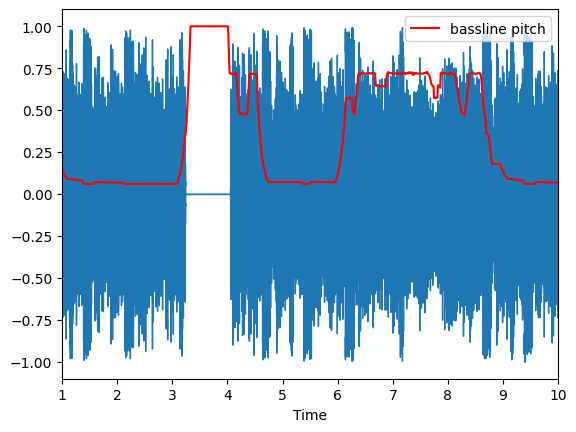

In [15]:
y1, sr = librosa.load(full_path_instr, mono=True, duration=10)
librosa.display.waveshow(y1, sr=sr)
plt.xlim([1,10])
plt.plot(time, np.array(instr_encodings)/max(instr_encodings), c='red',label='bassline pitch')
plt.legend()
plt.show()

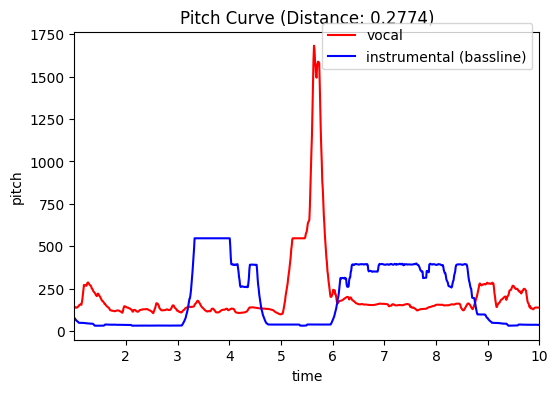

In [296]:
plt.figure(figsize=(6,4),dpi=100)
plt.plot(time, np.array(vocal_encodings), c='red',label='vocal')
plt.plot(time, np.array(instr_encodings), c='blue',label='instrumental (bassline)')
plt.xlabel('time')
plt.ylabel('pitch')
plt.title(f'Pitch Curve (Distance: {distance})')
plt.legend()
plt.legend(bbox_to_anchor=(1.0, 1.05))
plt.xlim([1.005,10])
plt.show()

In [ ]:
plt.plot(time, np.array(vocal_encodings), c='red',label='vocal')

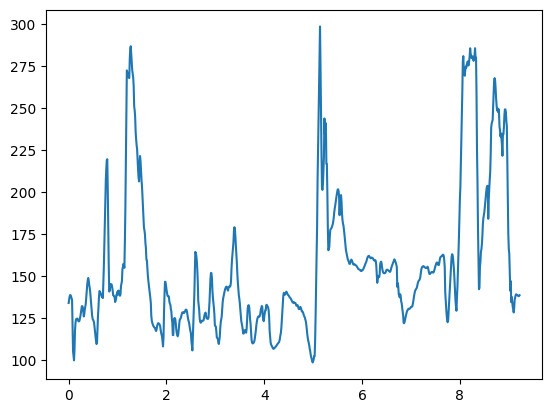

In [306]:
plt.plot(time[:923],np.array(vocal_encodings)[np.array(vocal_encodings)<=300])
plt.show()

### Test melody match

In [1]:
import os
import librosa
import librosa.display
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import wavfile
import crepe
import pandas as pd
import scipy.stats as stats
from pydub import AudioSegment
from pydub.playback import play
from scipy.signal import savgol_filter
import soundfile as sf
import IPython

In [74]:
MONO = True
DEFAULT_SAMPLE_RATE = 44100
# 0.5 is in seconds
section_offset = int(0.2*1000)
full_path_to_bassline = r'C:\Work\VocMatch\results\plotted_dfs\Week1\pitch_creepe\bass_lines\i_am_same_as_u_full_bassline.wav'
full_path_to_instrumental = r'C:\Work\VocMatch\data\full_beats\i_am_same_as_u_beat.wav'
full_path_to_vocal = r'C:\Work\VocMatch\data\audio_dataset\train\i_am_same_as_u_vox1_section_4_pitch_scale_-2.wav'#r'C:\Work\VocMatch\data\audio_dataset\train\u_need_only_emotions_asynch_vox3_section_1_time_stretch_0.96.wav'

In [75]:
# Load audios
#bassline, _ = librosa.load(full_path_to_bassline, sr=DEFAULT_SAMPLE_RATE, mono=MONO)
vocal, _ = librosa.load(full_path_to_vocal, sr=DEFAULT_SAMPLE_RATE, mono=MONO)
original_instrumental, _ = librosa.load(full_path_to_instrumental, sr=DEFAULT_SAMPLE_RATE, mono=MONO)
# Make it the same length as the bassline
original_instrumental = original_instrumental[:len(bassline)]

#bassline_time, bassline_freq, _, _ = crepe.predict(bassline, DEFAULT_SAMPLE_RATE, viterbi=True)
vocal_time, vocal_freq, _, _ = crepe.predict(vocal, DEFAULT_SAMPLE_RATE, viterbi=True)
# Cache bassline pitch curve
#temp_path = r'C:\Work\VocMatch\results\plotted_dfs\Week1\pitch_creepe\bass_lines\frequencies.npz'
#np.savez(temp_path,bassline_freq=bassline_freq,vocal_freq=vocal_freq)
#temp = np.load(temp_path)
#bassline_freq = temp['bassline_freq']
#vocal_freq = temp['vocal_freq']
# Smoothing the curve
window_size = 51
polynomial_order = 7
bassline_freq = savgol_filter(bassline_freq, window_size, polynomial_order) # window size 51, polynomial order 3
vocal_freq =  savgol_filter(vocal_freq, window_size, polynomial_order)

32/32 [==============================] - 11s 330ms/step


In [76]:
step_size = vocal_freq.shape[0]
section_offsets_max_dict = {}
correlation_treshold = 0.25
for i in range(0,bassline_freq.shape[0],step_size):
    section_start = i
    section_end = i+step_size
    # Key: section start, Value: correlation between the bassline section and the vocal
    section_offsets_dict = {}
    while(section_start<i+step_size):
        # Measure correlation
        # Deals with the end case
        if(section_end>bassline_freq.shape[0]):
            break
        section_offsets_dict[section_start] =  stats.pearsonr(bassline_freq[section_start:section_end],vocal_freq)[0]
        section_start+=section_offset
        section_end+=section_offset
    # Take the best correlation with ofset
    # Deals with the end case
    if(section_offsets_dict):
        max_section_start = max(section_offsets_dict, key=section_offsets_dict.get)
        # Check whehter there are already some offsets added to the global dict
        cur_cor = section_offsets_dict[max_section_start]
        # Add to the global dict only if corr bigger than the treshold
        if(correlation_treshold<cur_cor):
            section_offsets_max_dict[max_section_start] = cur_cor

C:\Users\renes\AppData\Local\Temp\ipykernel_29296\3799180918.py:32: RuntimeWarning: invalid value encountered in divide
  plt.plot(time, np.array(overposed_vocal)/(max(overposed_vocal))-SHIFT_THE_VOCAL_CURVE, c='red',label='vocal pitch', alpha=0.7)


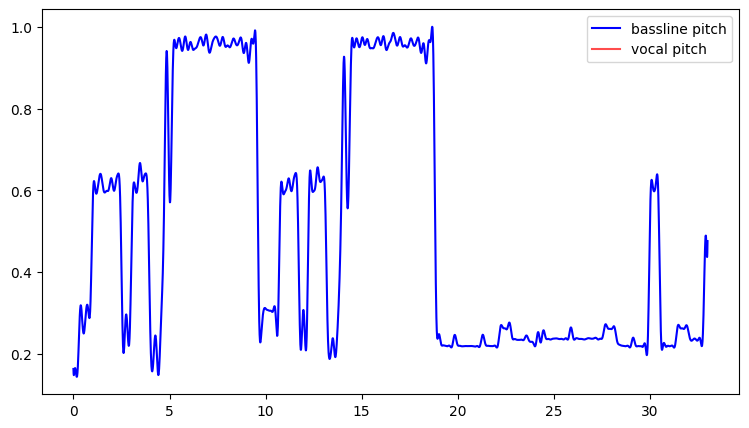

In [77]:

#librosa.display.waveshow(bassline, sr=DEFAULT_SAMPLE_RATE, alpha=0.7)
#librosa.display.waveshow(vocal, sr=DEFAULT_SAMPLE_RATE, alpha=0.5)
#plt.xlim([1,10])
plt.figure(figsize=(9,5), dpi=100)
SHIFT_THE_VOCAL_CURVE = -0.3
time = np.linspace(0,33,len(bassline_freq))
plt.plot(time, np.array(bassline_freq)/max(bassline_freq), c='blue',label='bassline pitch')
# encoded vocal with 0 paddings
overposed_vocal = np.zeros(bassline_freq.shape)
mixed_vocal_instrument = original_instrumental.copy()
prev_offset = np.NINF

for offset, correlation in section_offsets_max_dict.items():
    # To avoid overlapping when mixing everything visualy and in the audio
    if(offset-prev_offset>=section_offset and correlation>0):
        overposed_vocal[offset:offset+step_size] = vocal_freq
        # Visual mixing
        # The text should start at the beninning of the vocal, but we shift it closer to the center of the vocal
        x_coordinate_for_text = offset/100+step_size/400
        plt.text(x_coordinate_for_text, 0.125, f'{round(correlation,3)}', horizontalalignment='center',verticalalignment='center')
        # Audio mixing
        audio_offset = int(((offset-1)/100)*DEFAULT_SAMPLE_RATE)
        if audio_offset<0:
            audio_offset = 0
        # Make the instrumental twice quiter
        mixed_vocal_instrument[audio_offset:audio_offset+len(vocal)] *= 0.5
        mixed_vocal_instrument[audio_offset:audio_offset+len(vocal)] += vocal


    prev_offset = offset
# -.5 to shift the curve closer to the bassline curve
plt.plot(time, np.array(overposed_vocal)/(max(overposed_vocal))-SHIFT_THE_VOCAL_CURVE, c='red',label='vocal pitch', alpha=0.7)
plt.legend()
plt.show()

In [78]:
IPython.display.Audio(mixed_vocal_instrument, rate=DEFAULT_SAMPLE_RATE)

In [65]:
section_offsets_max_dict

{800: 0.31989642509793303}

In [ ]:
final_coef_of_similiarity = sum(section_offsets_max_dict.values())/len(section_offsets_max_dict)
final_coef_of_similiarity


In [21]:
sf.write(r'C:\Work\VocMatch\results\plotted_dfs\Week1\pitch_creepe\bass_lines\mixed_same_as_u_beat_moses_vocal.wav', mixed_vocal_instrument, DEFAULT_SAMPLE_RATE, subtype='PCM_24')